# Project Ventoux part two: multiple polynomial regression on Beatport and Spotify electronic music data


## Importing data

### libraries and methods

In [3]:
# I chose the name of a famous DC zoo panda instead of the boring pd
import pandas as tian #named after a DC zoo panda
tian.set_option('display.max_columns', None) #invoking pandas setting I always prefer

#another divergence because it makes me laugh
import numpy as lumpnump
import matplotlib.pyplot as plt
import os
from sklearn import metrics, linear_model, preprocessing, model_selection
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, PowerTransformer, PolynomialFeatures
from scipy.stats import pearsonr
import seaborn as sns

### File import 

In [4]:
top_tracks_stem = os.getenv('TOP_TRACKS_STEM')

toptracks_bpmeta_matrix_csv = f'{top_tracks_stem}/toptracks_bpmeta_matrix'
toptracks_bpmeta_matrix_df_csv = f'{top_tracks_stem}/toptracks_bpmeta_matrix_df'

toptracks_bpmeta_matrix_df = tian.read_csv(toptracks_bpmeta_matrix_df_csv)
toptracks_bpmeta_matrix = lumpnump.genfromtxt(toptracks_bpmeta_matrix_csv, delimiter=',')

toptracks_bpmeta_matrix_df_columns = toptracks_bpmeta_matrix_df.columns
toptracks_bpmeta_matrix_df_dict = {name: idx for idx, name in enumerate(toptracks_bpmeta_matrix_df_columns)}

In [5]:
toptracks_bpmeta_matrix_df.head()

,isrc_numeric,release_id,release_date,release_year,release_month,label_id,track_id,genre_id_x,mix_id,is_remixed,duration,duration_ms,bpm,key_id,time_signature,mode,valence,danceability,energy,speechiness,loudness,liveness,instrumentalness,acousticness,year,genre_id_y,rank,beatport_track_id,points
0,2613012100395,3650447,20211001,2021,10,100342,16223515,98,1,1,615,375550,113.0,34,4,0,0.343,0.842,0.702,0.0667,-13.397,0.0253,0.0378,0.00539,2023,98,2056,16223515,13
1,471072337324,4221505,20230818,2023,8,106937,18007905,98,1,1,551,351451,112.0,4,4,1,0.287,0.792,0.536,0.0600,-10.620,0.0840,0.7770,0.00192,2023,98,1535,18007905,124
2,72126162358275,4181814,20230707,2023,7,90543,17891432,98,1,1,714,434076,112.0,4,4,1,0.429,0.811,0.451,0.0681,-17.617,0.0748,0.3870,0.05010,2023,98,2213,17891432,1
3,72126162358279,4181814,20230707,2023,7,90543,17891439,98,1,1,830,510040,112.0,33,4,1,0.319,0.809,0.582,0.0499,-13.404,0.2800,0.3310,0.00905,2023,98,2114,17891439,8
4,72126162358286,4181814,20230707,2023,7,90543,17891451,98,1,1,623,383634,112.0,24,4,0,0.229,0.841,0.477,0.0796,-11.217,0.1710,0.9220,0.05160,2023,98,1132,17891451,297


## Defining scaling functions



### StandardScaler function
Inputs: train, validation, test data. Returns standard scaled data.

In [6]:
def standard_scaling(x_train, x_validate, x_test, y_train, y_validate, y_test):
    x_features_scaler = StandardScaler()
    y_output_scaler = StandardScaler()

    # training
    x_train_scaled = x_features_scaler.fit_transform(x_train)
    y_train_scaled = y_output_scaler.fit_transform(y_train)

    # validation
    x_validate_scaled = x_features_scaler.transform(x_validate)
    y_validate_scaled = y_output_scaler.transform(y_validate)

    # test
    x_test_scaled = x_features_scaler.transform(x_test)
    y_test_scaled = y_output_scaler.transform(y_test)

    return x_train_scaled, y_train_scaled, x_validate_scaled, y_validate_scaled, x_test_scaled, y_test_scaled


### PowerTransformer function
Inputs: train, validation, test data. Returns power transformer scaled data.

In [7]:
def power_scaling(x_train, x_validate, x_test, y_train, y_validate, y_test):
    x_features_scaler = PowerTransformer()
    y_output_scaler = PowerTransformer()

    #training
    x_train_scaled = x_features_scaler.fit_transform(x_train)
    y_train_scaled = y_output_scaler.fit_transform(y_train.reshape(-1, 1))

    #validation
    x_validate_scaled = x_features_scaler.transform(x_validate)
    y_validate_scaled = y_output_scaler.transform(y_validate.reshape(-1, 1))

    #test
    x_test_scaled = x_features_scaler.transform(x_test)
    y_test_scaled = y_output_scaler.transform(y_test.reshape(-1, 1))

    return x_train_scaled, y_train_scaled, x_validate_scaled, y_validate_scaled, x_test_scaled, y_test_scaled

## Preparing data for regression

### Creating label and genre mapping references
Using the same labels and genres as [part 1](https://www.uwsthoughts.com/linear-logistic-regression/) for continuity between public releases


In [8]:
subset_genres = [6, 90, 93]
subset_genres_dict = {
    6: "Techno (Peak Time/Driving)",
    90: "Melodic House & Techno",
    93: "Organic House / Downtempo"
}

techno = subset_genres_dict[6] 
melodic = subset_genres_dict[90] 
organic = subset_genres_dict[93]

subset_labels = [1390, 23038, 2027, 56958]

label_ids_dict = {
    1390:'Ajunadeep',
    23038: 'All Day I Dream',
    2027: 'Drumcode',
    56958: 'Afterlife Records'
}

afterlife = label_ids_dict[56958]
anjunadeep = label_ids_dict[1390]
drumcode = label_ids_dict[2027]
dreamer = label_ids_dict[23038]

# separates out IDs of x features and y target to transform and ID values I want to stay the same
core_x_features = [16, 17, 18, 19, 20, 21, 22, 23]
core_y_target = 28
core_id_values = [0, 3, 5, 7]

# these are ratios needed for different parts of the train/test/split flow 
train_ratio = 0.6
validate_ratio = 0.5
test_validate_ratio = 0.4

### Splitting and normalizing

#### Standard Scaling
This takes a copy of the baseline matrix and then applies standard scaling on the feature and output components while setting aside the IDs. Everything is then put back together so I can easily filter the scaled data on the IDs.

In [9]:
standard_scaler_matrix = toptracks_bpmeta_matrix
standard_scaler_ids = standard_scaler_matrix[:, core_id_values]
standard_scaler_x_features = standard_scaler_matrix[:, core_x_features]

#this reshape is because I need the y target to have the same shape as the x features
standard_scaler_y_output = standard_scaler_matrix[:, core_y_target].reshape(-1, 1)

# 60/40 training/not training
x_train, x_temp, y_train, y_temp, ids_train, ids_temp = train_test_split(standard_scaler_x_features, 
                    standard_scaler_y_output, standard_scaler_ids, test_size=test_validate_ratio, train_size=train_ratio, shuffle=True)

#50/50 split of not training into validate and test sets
x_validate, x_test, y_validate, y_test, ids_validate, ids_test = train_test_split(x_temp, y_temp, ids_temp, 
                                                                test_size=validate_ratio, shuffle=True)


#applying scaling
x_train_standard_scaled, y_train_standard_scaled, x_validate_standard_scaled, y_validate_standard_scaled, x_test_standard_scaled, y_test_standard_scaled = standard_scaling(x_train, x_validate, x_test, y_train, y_validate, y_test)

#somewhere along the way my y values became tuples and I was over it so I'm just smashing them back to arrays here
y_train_standard_scaled = lumpnump.array(y_train_standard_scaled).reshape(-1, 1)
y_validate_standard_scaled = lumpnump.array(y_validate_standard_scaled).reshape(-1, 1)
y_test_standard_scaled = lumpnump.array(y_test_standard_scaled).reshape(-1, 1)


#reassembling data after scaling
standard_scaling_train = lumpnump.hstack((ids_train, x_train_standard_scaled, y_train_standard_scaled))
standard_scaling_validate = lumpnump.hstack((ids_validate, x_validate_standard_scaled, y_validate_standard_scaled))
standard_scaling_test = lumpnump.hstack((ids_test, x_test_standard_scaled, y_test_standard_scaled))

# Splits size check
print("train:", standard_scaling_train.shape)
print("validate:", standard_scaling_validate.shape)
print("test:", standard_scaling_test.shape)

train: (57196, 13)
validate: (19066, 13)
test: (19066, 13)


#### Power Transformation Scaling

In [10]:
power_scaler_matrix = toptracks_bpmeta_matrix
power_scaler_ids = power_scaler_matrix[:, core_id_values]
power_scaler_x_features = power_scaler_matrix[:, core_x_features]
power_scaler_y_output = power_scaler_matrix[:, core_y_target].reshape(-1, 1)

x_train, x_temp, y_train, y_temp, ids_train, ids_temp = train_test_split(power_scaler_x_features, 
                    power_scaler_y_output, power_scaler_ids, test_size=test_validate_ratio, train_size=train_ratio, shuffle=True)

x_validate, x_test, y_validate, y_test, ids_validate, ids_test = train_test_split(x_temp, y_temp, ids_temp, 
                                                                test_size=validate_ratio, shuffle=True)


x_train_power_scaled, y_train_power_scaled, x_validate_power_scaled, y_validate_power_scaled, x_test_power_scaled, y_test_power_scaled = power_scaling(x_train, x_validate, x_test, y_train, y_validate, y_test)

y_train_power_scaled = lumpnump.array(y_train_power_scaled).reshape(-1, 1)
y_validate_power_scaled = lumpnump.array(y_validate_power_scaled).reshape(-1, 1)
y_test_power_scaled = lumpnump.array(y_test_power_scaled).reshape(-1, 1)

power_scaling_train = lumpnump.hstack((ids_train, x_train_power_scaled, y_train_power_scaled))
power_scaling_validate = lumpnump.hstack((ids_validate, x_validate_power_scaled, y_validate_power_scaled))
power_scaling_test = lumpnump.hstack((ids_test, x_test_power_scaled, y_test_power_scaled))

print("train:", power_scaling_train.shape)
print("validate:", power_scaling_validate.shape)
print("test:", power_scaling_test.shape)


train: (57196, 13)
validate: (19066, 13)
test: (19066, 13)


### Defining Regression and Plot Functions

#### Multiple Polynomal Regression Fitting Function
Input: transformed train and validate data, polynomial degrees as array to run. Returns: mean squared errors for train and validate data.

In [11]:
def poly_degree_regress(x_train, y_train, x_validate, y_validate, degrees):
    train_mean_squared_errors = []
    validate_mean_squared_errors = []

    for degree in degrees:
        polynomial = PolynomialFeatures(degree, include_bias=False)

        # train poly transformation, regression, and mse
        poly_xtrain_mapped = polynomial.fit_transform(x_train)
        model = linear_model.LinearRegression()
        model.fit(poly_xtrain_mapped, y_train)
        train_y_hat = model.predict(poly_xtrain_mapped)
        train_mean_squared_error = mean_squared_error(y_train, train_y_hat) / 2
        train_mean_squared_errors.append(train_mean_squared_error)

        # validate poly transformation and mse
        poly_xvalidate_mapped = polynomial.transform(x_validate)
        validate_y_hat = model.predict(poly_xvalidate_mapped)
        validate_mean_squared_error = mean_squared_error(y_validate, validate_y_hat) / 2
        validate_mean_squared_errors.append(validate_mean_squared_error)

    return train_mean_squared_errors, validate_mean_squared_errors


#### Multiple Polynomal Regression Cost Curve Plot Function
Inputs: train, validate, test data, chart title, polynomial degrees as array. Outputs: 3 columns with 4 charts - scatter plot, 3 model fit charts with R2, Mean Squared Error, and Pearson Correlation Coefficient below them.

In [12]:
def poly_regress_plots(x_train, y_train, x_validate, y_validate, x_test, y_test, title_label, degrees):
    print(f"{title_label} training shape:", x_train.shape)
    print(f"{title_label} validate shape:", x_validate.shape)
    print(f"{title_label} test shape:", x_test.shape)
    
    sorted_indices_train = lumpnump.argsort(x_train[:, 3])
    sorted_indices_validate = lumpnump.argsort(x_validate[:, 3])
    sorted_indices_test = lumpnump.argsort(x_test[:, 3])

    sorted_xtrain = x_train[sorted_indices_train, 3]
    sorted_xvalidate = x_validate[sorted_indices_validate, 3]
    sorted_xtest = x_test[sorted_indices_test, 3]

    sorted_ytrain = y_train[sorted_indices_train]
    sorted_yvalidate = y_validate[sorted_indices_validate]
    sorted_ytest = y_test[sorted_indices_test]

    plt.figure(figsize=(25, 28))

    for i, degree in enumerate(degrees, start=1):
        poly = PolynomialFeatures(degree=degree)
        x_poly_train = poly.fit_transform(x_train)
        x_poly_validate = poly.fit_transform(x_validate)
        x_poly_test = poly.fit_transform(x_test)

        model = linear_model.LinearRegression()
        model.fit(x_poly_train, y_train)
        y_poly_pred_train = model.predict(x_poly_train)

        model.fit(x_poly_validate, y_validate)
        y_poly_pred_validate = model.predict(x_poly_validate)

        model.fit(x_poly_test, y_test)
        y_poly_pred_test = model.predict(x_poly_test)

        sorted_y_poly_pred_train = y_poly_pred_train[sorted_indices_train]
        sorted_y_poly_pred_validate = y_poly_pred_validate[sorted_indices_validate]
        sorted_y_poly_pred_test = y_poly_pred_test[sorted_indices_test]

        # Scatter plot with density
        plt.subplot(5, 3, i)
        sns.kdeplot(x=sorted_xtrain, y=sorted_ytrain, fill=True, cmap="Blues", cbar=True)
        plt.scatter(sorted_xtrain, sorted_ytrain, color='blue', alpha=0.6, label='actuals')
        plt.xlabel('speechiness')
        plt.ylabel('points')
        plt.legend()
        plt.title(f'{title_label}: scatter plot with density')

        # training plot
        plt.subplot(5, 3, i + 3)
        plt.scatter(sorted_xtrain, sorted_ytrain, c='deepskyblue', label='actuals')
        plt.plot(sorted_xtrain, sorted_y_poly_pred_train, c='plum', label='predicted')
        plt.xlabel('speechiness')
        plt.ylabel('points')
        plt.legend()
        plt.title(f'{degree}th/nd degree polynomial: training')
        r2_train = r2_score(y_train, y_poly_pred_train)
        mse_train = mean_squared_error(y_train, y_poly_pred_train)
        pearson_corr_train, _ = pearsonr(y_train, y_poly_pred_train)
        plt.text(0.3, -.2, f"R^2: {r2_train:.4f}\nMSE: {mse_train:.4f}\npearson CC: {pearson_corr_train:.4f}", 
                 ha='center', va='bottom', transform=plt.gca().transAxes)

        # validation plot
        plt.subplot(5, 3, i + 6)
        plt.scatter(sorted_xvalidate, sorted_yvalidate, c='deepskyblue', label='actuals')
        plt.plot(sorted_xvalidate, sorted_y_poly_pred_validate, c='plum', label='predicted')
        plt.legend()
        plt.title(f'{degree}th/nd degree: validation')
        r2_validate = r2_score(y_validate, y_poly_pred_validate)
        mse_validate = mean_squared_error(y_validate, y_poly_pred_validate)
        pearson_corr_validate, _ = pearsonr(y_validate, y_poly_pred_validate)
        plt.text(0.3, -.2, f"R^2: {r2_validate:.4f}\nMSE: {mse_validate:.4f}\npearson CC: {pearson_corr_validate:.4f}", 
                 ha='center', va='bottom', transform=plt.gca().transAxes)

        # test plot
        plt.subplot(5, 3, i + 9)
        plt.scatter(sorted_xtest, sorted_ytest, c='deepskyblue', label='actuals')
        plt.plot(sorted_xtest, sorted_y_poly_pred_test, c='plum', label='predicted')
        plt.legend()
        plt.title(f'{degree}th/nd degree: test data')
        r2_test = r2_score(y_test, y_poly_pred_test)
        mse_test = mean_squared_error(y_test, y_poly_pred_test)
        pearson_corr_test, _ = pearsonr(y_test, y_poly_pred_test)
        plt.text(0.3, -.2, f"R^2: {r2_test:.4f}\nMSE: {mse_test:.4f}\npearson CC: {pearson_corr_test:.4f}", 
                 ha='center', va='bottom', transform=plt.gca().transAxes)

    plt.tight_layout()
    plt.show()


#### Mean Squared Error Cost Curve Plot Function
Inputs: degrees as array, MSEs for training and validation fittings, and chart title component. Outputs: three charts that plot the MSEs in relation to polynomial degree and cost.

In [13]:
def plot_mse_charts(degrees, train_mses, validate_mses, title_label):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # train and validate together
    axes[0].plot(degrees, train_mses, marker="s", c='cornflowerblue', label='training')
    axes[0].plot(degrees, validate_mses, marker="P", c='fuchsia', label='validation')
    axes[0].set_title(title_label + " training and validation")
    axes[0].set_xlabel("Poly Degrees")
    axes[0].set_ylabel("MSEs")
    axes[0].legend()
    
    # train only
    axes[1].plot(degrees, train_mses, marker="s", c='cornflowerblue', label='training')
    axes[1].set_title("training")
    axes[1].set_xlabel("poly degrees")
    axes[1].set_ylabel("MSEs")
    axes[1].legend()
    
    # validate only
    axes[2].plot(degrees, validate_mses, marker="P", c='fuchsia', label='validation')
    axes[2].set_title("validation")
    axes[2].set_xlabel("poly degrees")
    axes[2].set_ylabel("MSEs")
    axes[2].legend()
    
    plt.tight_layout()
    plt.show()

## Running and graphing normalization techniques for each genre and label

### Standard Scaling by Genre

#### Techno (Peak Time/Driving)

techno train MSEs: [0.44909449663944734, 0.4387556926861504, 0.4060756447943611, 0.3145394258437502, 0.14034598257099473]
techno validate MSEs: [0.6171030610993979, 0.6937209073300855, 3401.8095748638093, 3191592.4367192695, 6527971381223.275]


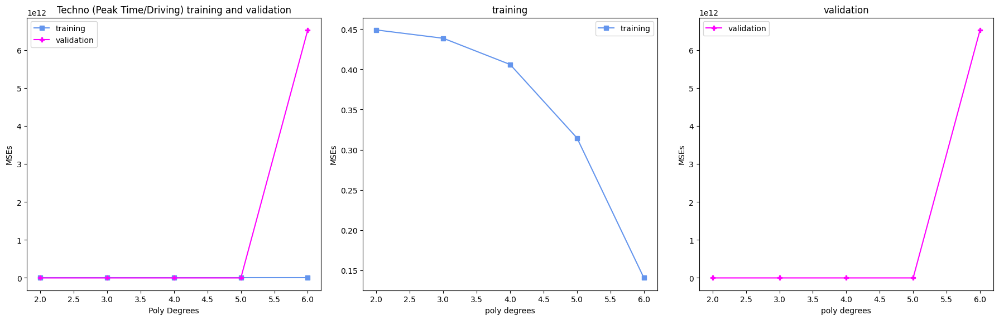

In [14]:
techno_degrees = [2, 3, 4, 5, 6]
techno_genre_mask = (standard_scaling_train[:, 3] == 6.)
techno_genre_validate_mask = (standard_scaling_validate[:, 3] == 6.)
techno_genre_test_mask = (standard_scaling_test[:, 3] == 6.)

techno_xtrain = standard_scaling_train[techno_genre_mask, 4:12]
techno_ytrain = standard_scaling_train[techno_genre_mask, 12]

techno_xvalidate = standard_scaling_validate[techno_genre_validate_mask, 4:12]
techno_yvalidate = standard_scaling_validate[techno_genre_validate_mask, 12]

techno_xtest = standard_scaling_test[techno_genre_test_mask, 4:12]
techno_ytest = standard_scaling_test[techno_genre_test_mask, 12]

techno_train_mses, techno_validate_mses = poly_degree_regress(techno_xtrain, techno_ytrain, techno_xvalidate, 
                                                              techno_yvalidate, techno_degrees)

print("techno train MSEs:", techno_train_mses)
print("techno validate MSEs:", techno_validate_mses)
plot_mse_charts(techno_degrees, techno_train_mses, techno_validate_mses, techno)

Techno (Peak Time/Driving) training shape: (2911, 8)
Techno (Peak Time/Driving) validate shape: (956, 8)
Techno (Peak Time/Driving) test shape: (990, 8)


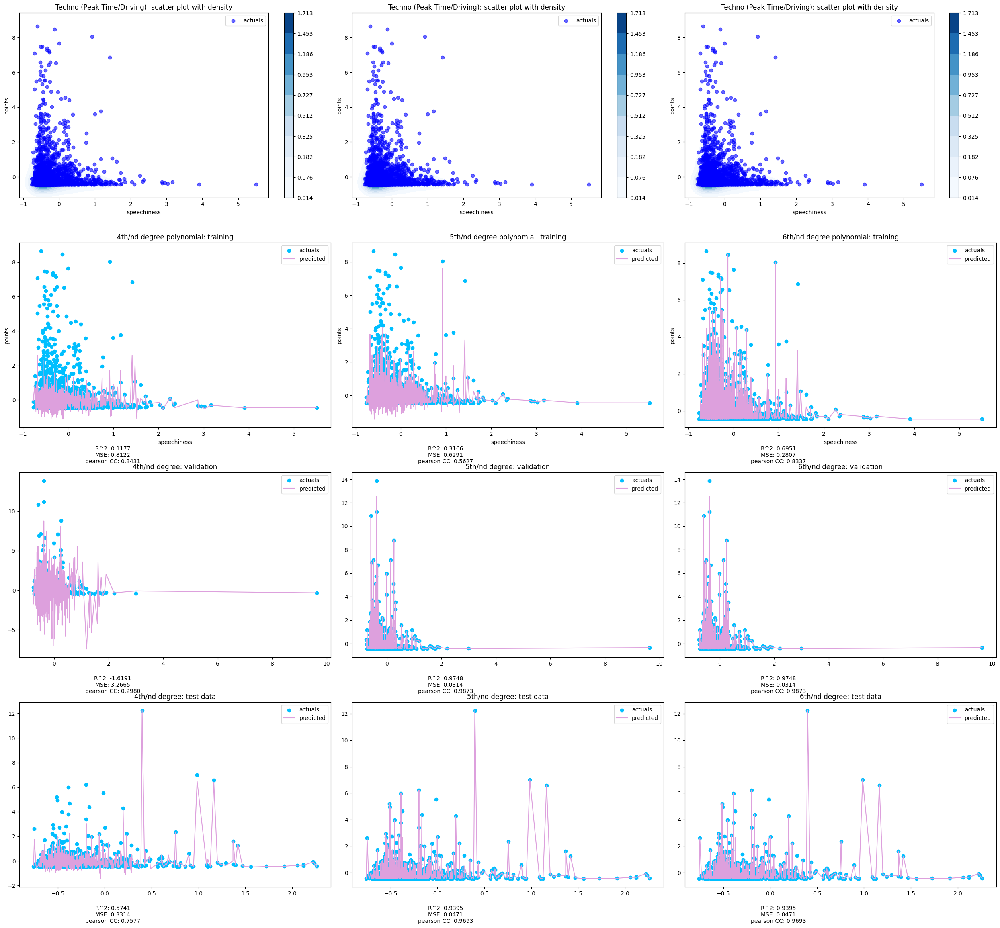

In [15]:
poly_regress_plots(techno_xtrain, techno_ytrain, techno_xvalidate, techno_yvalidate, techno_xtest, techno_ytest, techno, [4,5,6])

#### Melodic House & Techno

melodic training MSEs: [0.3087008429163502, 0.2878736439043681, 0.24469883559480113, 0.16745040774975126, 0.09594519517549073]
melodic validation MSEs: [0.42015777289944417, 0.4591391318369493, 2.8151740229780944, 13230.31777194633, 53577214.06536111]


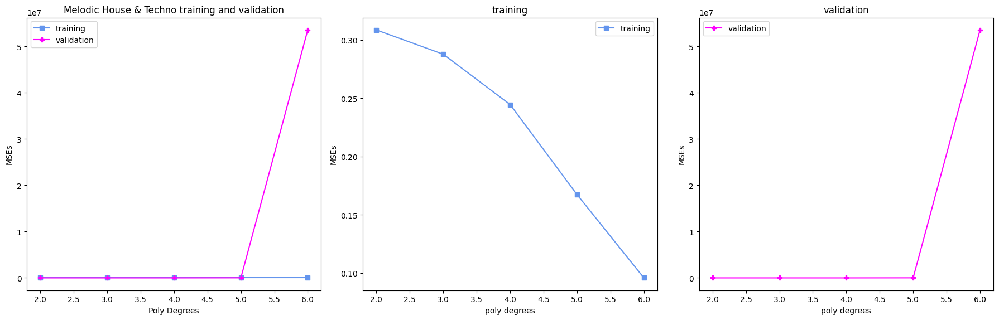

In [16]:
melodic_degrees = [2, 3, 4, 5, 6]
melodic_genre_mask = (standard_scaling_train[:, 3] == 90.)
melodic_genre_validate_mask = (standard_scaling_validate[:, 3] == 90.)
melodic_genre_test_mask = (standard_scaling_test[:, 3] == 90.)

melodic_xtrain = standard_scaling_train[melodic_genre_mask, 4:12]
melodic_ytrain = standard_scaling_train[melodic_genre_mask, 12]

melodic_xvalidate = standard_scaling_validate[melodic_genre_validate_mask, 4:12]
melodic_yvalidate = standard_scaling_validate[melodic_genre_validate_mask, 12]

melodic_xtest = standard_scaling_test[melodic_genre_test_mask, 4:12]
melodic_ytest = standard_scaling_test[melodic_genre_test_mask, 12]

melodic_train_mses, melodic_validate_mses = poly_degree_regress(melodic_xtrain, melodic_ytrain, melodic_xvalidate, melodic_yvalidate, melodic_degrees)

print("melodic training MSEs:", melodic_train_mses)
print("melodic validation MSEs:", melodic_validate_mses)
plot_mse_charts(melodic_degrees, melodic_train_mses, melodic_validate_mses, melodic)

Melodic House & Techno training shape: (2390, 8)
Melodic House & Techno validate shape: (827, 8)
Melodic House & Techno test shape: (858, 8)


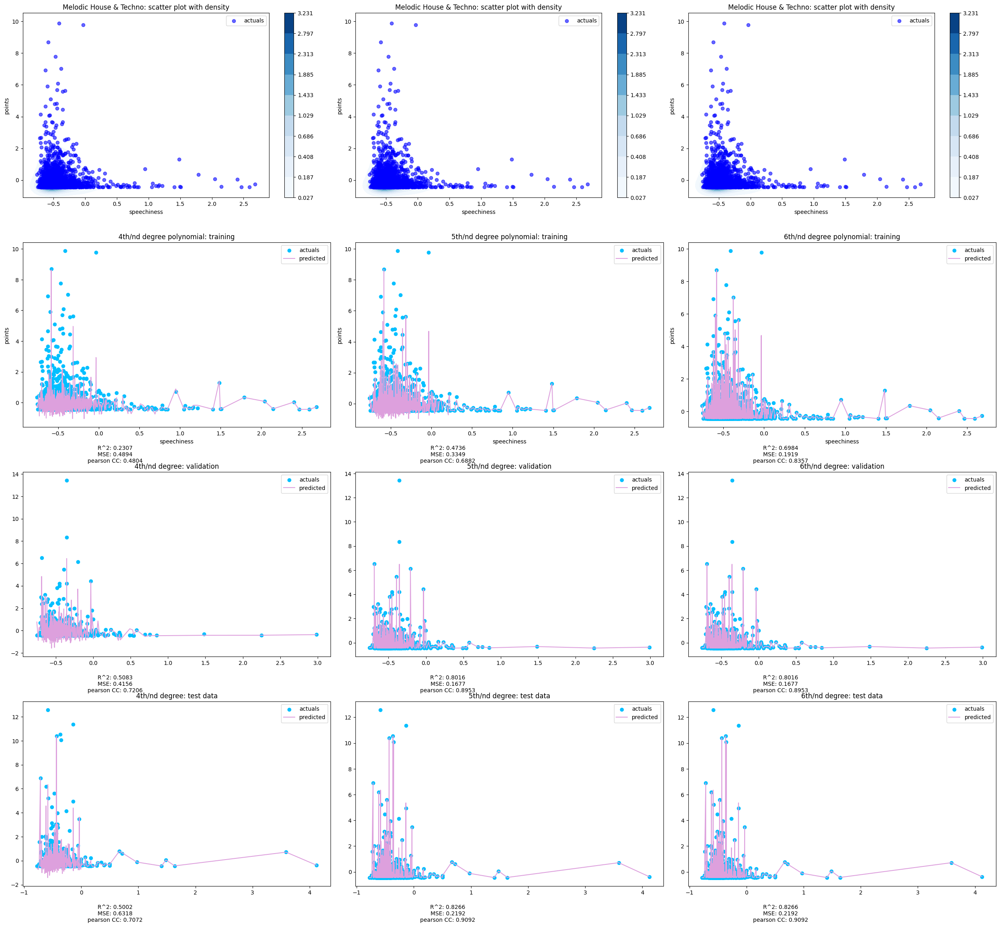

In [17]:
poly_regress_plots(melodic_xtrain, melodic_ytrain, melodic_xvalidate, melodic_yvalidate, melodic_xtest, melodic_ytest, melodic, [4,5,6])

#### Organic house/down tempo

organic training MSEs: [0.3213731167390715, 0.3104866592269167, 0.2797061619740099, 0.19058718438737016, 0.10396043581729636]
organic validation MSEs: [0.28617966533484923, 0.3396751025055583, 8.502065487040669, 343455.5725601474, 949923897.4153273]


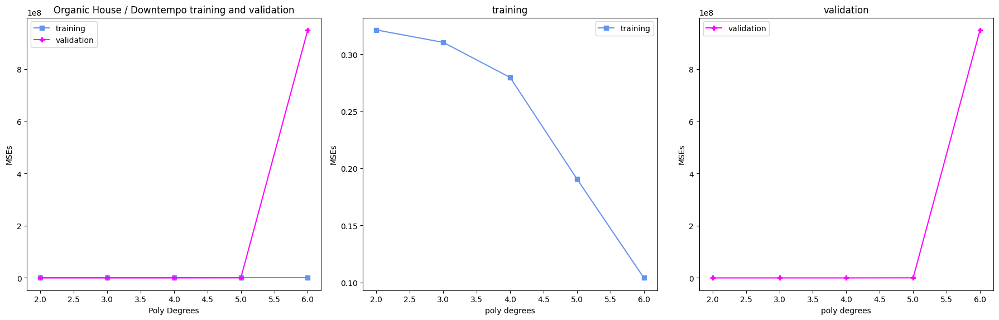

In [18]:
organic_degrees = [2, 3, 4, 5, 6]
organic_genre_mask = (standard_scaling_train[:, 3] == 93.)
organic_genre_validate_mask = (standard_scaling_validate[:, 3] == 93.)

organic_xtrain = standard_scaling_train[organic_genre_mask, 4:12]
organic_ytrain = standard_scaling_train[organic_genre_mask, 12]

organic_xvalidate = standard_scaling_validate[organic_genre_validate_mask, 4:12]
organic_yvalidate = standard_scaling_validate[organic_genre_validate_mask, 12]

organic_xtest = standard_scaling_test[organic_genre_validate_mask, 4:12]
organic_ytest = standard_scaling_test[organic_genre_validate_mask, 12]

organic_train_mses, organic_validate_mses = poly_degree_regress(organic_xtrain, organic_ytrain, organic_xvalidate, organic_yvalidate, organic_degrees)

print("organic training MSEs:", organic_train_mses)
print("organic validation MSEs:", organic_validate_mses)
plot_mse_charts(organic_degrees, organic_train_mses, organic_validate_mses, organic)

Organic House / Downtempo training shape: (2263, 8)
Organic House / Downtempo validate shape: (792, 8)
Organic House / Downtempo test shape: (792, 8)


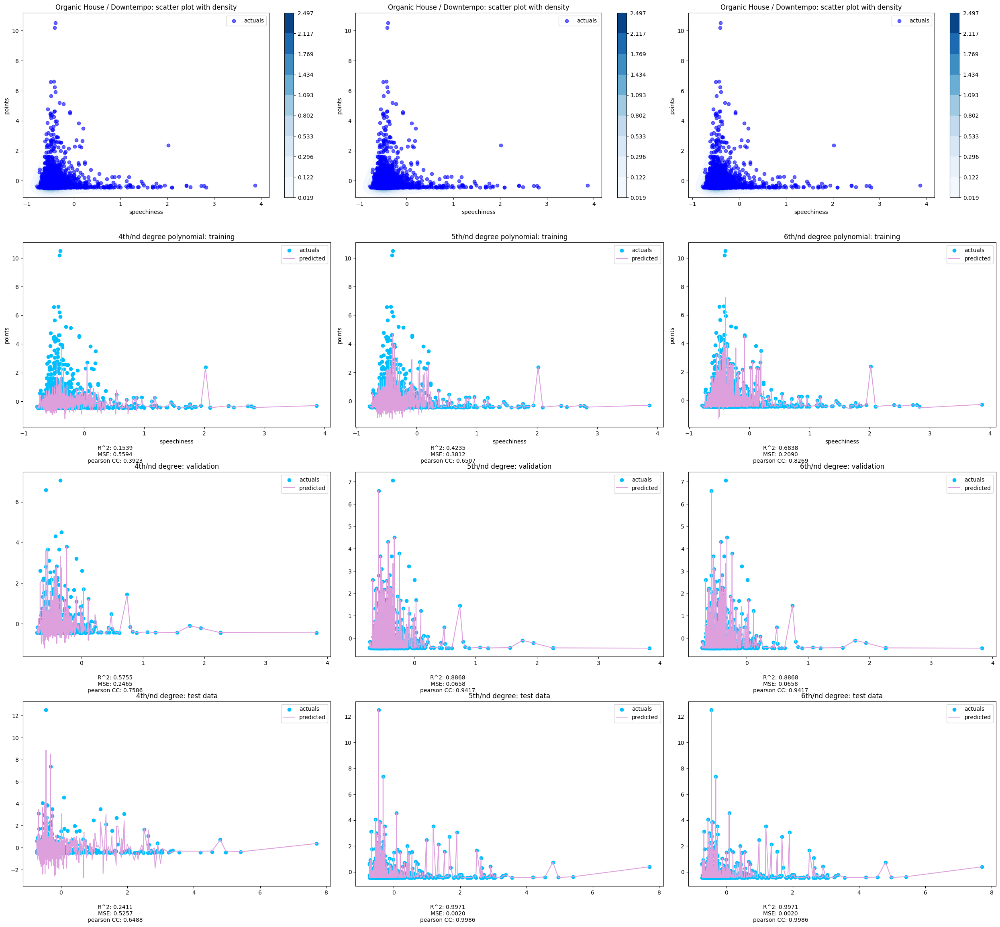

In [19]:
poly_regress_plots(organic_xtrain, organic_ytrain, organic_xvalidate, organic_yvalidate, organic_xtest, organic_ytest, organic, [4,5,6])

### Standard Scaling by Label

#### Afterlife
Melodic techno label founded by Tale of Us. Afterlife peaked in 2021 and it's been all down hill since and I'm gonna find the data to prove it. That garbage Anyma is producing? Reminds me of all the junk EDMs from the early 2010s. Currently in a dog fight with Drumcode over what the future of big room techno will sounds like.

afterlife training MSEs: [0.5660478956392151, 0.34983666989088585, 0.34983666989088585, 0.34983666989088585, 0.34983666989088585]
afterlife validation MSEs: [5.711784545253587, 591.6352293050102, 184.54108058055388, 595.722287167361, 615.1020898807909]


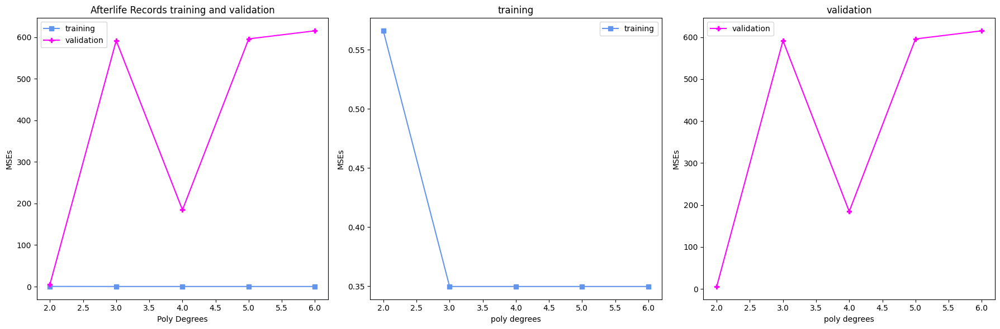

In [20]:
afterlife_degrees = [2, 3, 4, 5, 6]
afterlife_label_mask = (standard_scaling_train[:, 2] == 56958.)
afterlife_label_validate_mask = (standard_scaling_validate[:, 2] == 56958.)

afterlife_xtrain = standard_scaling_train[afterlife_label_mask, 4:12]
afterlife_ytrain = standard_scaling_train[afterlife_label_mask, 12]

afterlife_xvalidate = standard_scaling_validate[afterlife_label_validate_mask, 4:12]
afterlife_yvalidate = standard_scaling_validate[afterlife_label_validate_mask, 12]

afterlife_xtest = standard_scaling_test[afterlife_label_validate_mask, 4:12]
afterlife_ytest = standard_scaling_test[afterlife_label_validate_mask, 12]

afterlife_train_mses, afterlife_validate_mses = poly_degree_regress(afterlife_xtrain, afterlife_ytrain, afterlife_xvalidate, afterlife_yvalidate, afterlife_degrees)

print("afterlife training MSEs:", afterlife_train_mses)
print("afterlife validation MSEs:", afterlife_validate_mses)
plot_mse_charts(afterlife_degrees, afterlife_train_mses, afterlife_validate_mses, afterlife)

Afterlife Records training shape: (163, 8)
Afterlife Records validate shape: (61, 8)
Afterlife Records test shape: (61, 8)


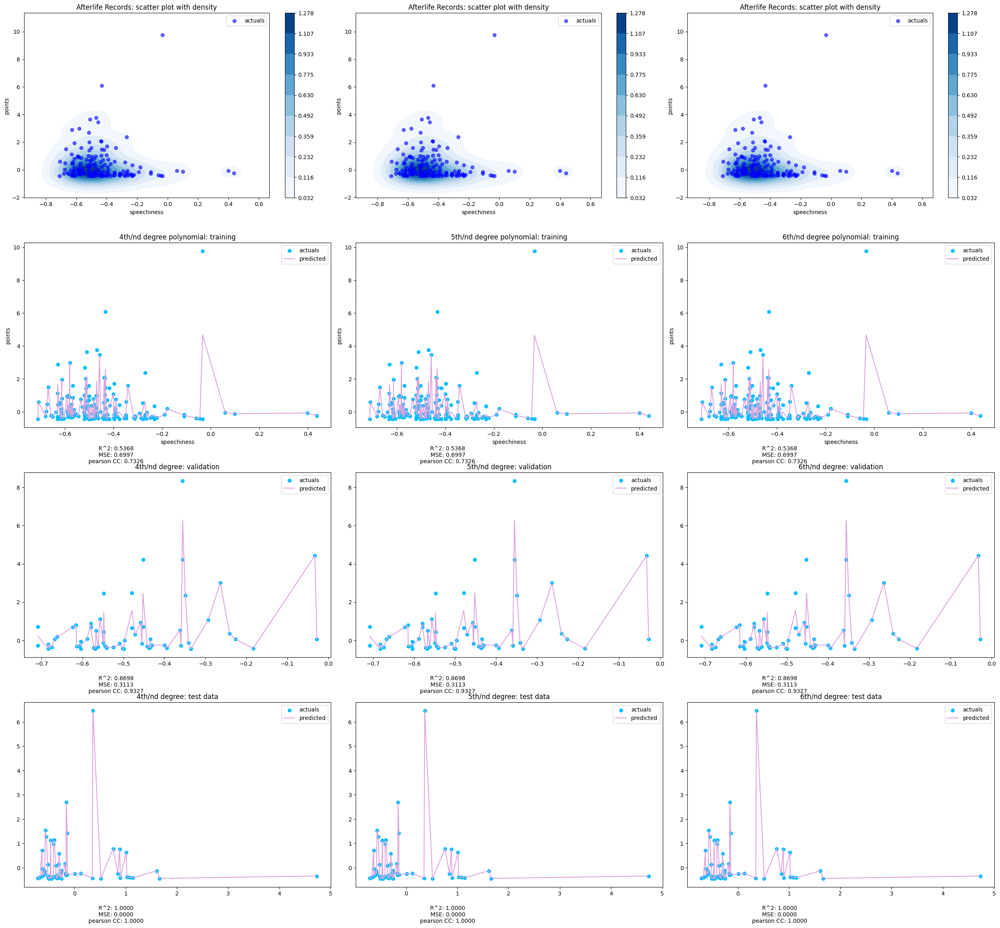

In [21]:
poly_regress_plots(afterlife_xtrain, afterlife_ytrain, afterlife_xvalidate, afterlife_yvalidate, afterlife_xtest, afterlife_ytest, afterlife, [4,5,6])

#### Anjunadeep
Melodic house, among other house genres, label. Sister label of Anjunabeats, the famous trance label founded by Above & Beyond. 

anjunadeep training MSEs: [0.17210445306013586, 0.0831807322575528, 0.04673178973392943, 0.04673178973392945, 0.04673178973392943]
anjunadeep validation MSEs: [0.1650758634786813, 38.01014454624887, 106.75238399844439, 530.0611253784454, 42187.70737597433]


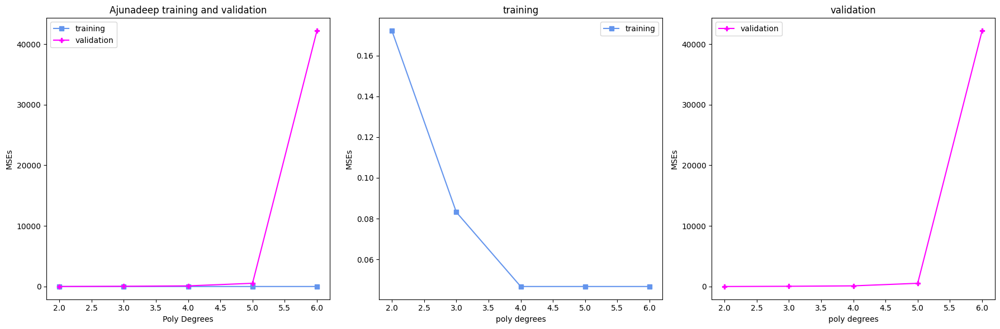

In [22]:
anjunadeep_degrees = [2, 3, 4, 5, 6]
anjunadeep_label_mask = (standard_scaling_train[:, 2] == 1390.)
anjunadeep_label_validate_mask = (standard_scaling_validate[:, 2] == 1390.)

anjunadeep_xtrain = standard_scaling_train[anjunadeep_label_mask, 4:12]
anjunadeep_ytrain = standard_scaling_train[anjunadeep_label_mask, 12]

anjunadeep_xvalidate = standard_scaling_validate[anjunadeep_label_validate_mask, 4:12]
anjunadeep_yvalidate = standard_scaling_validate[anjunadeep_label_validate_mask, 12]

anjunadeep_xtest = standard_scaling_test[anjunadeep_label_validate_mask, 4:12]
anjunadeep_ytest = standard_scaling_test[anjunadeep_label_validate_mask, 12]

anjunadeep_train_mses, anjunadeep_validate_mses = poly_degree_regress(anjunadeep_xtrain, anjunadeep_ytrain, anjunadeep_xvalidate, anjunadeep_yvalidate, anjunadeep_degrees)

print("anjunadeep training MSEs:", anjunadeep_train_mses)
print("anjunadeep validation MSEs:", anjunadeep_validate_mses)
plot_mse_charts(anjunadeep_degrees, anjunadeep_train_mses, anjunadeep_validate_mses, anjunadeep)

Ajunadeep training shape: (236, 8)
Ajunadeep validate shape: (87, 8)
Ajunadeep test shape: (87, 8)


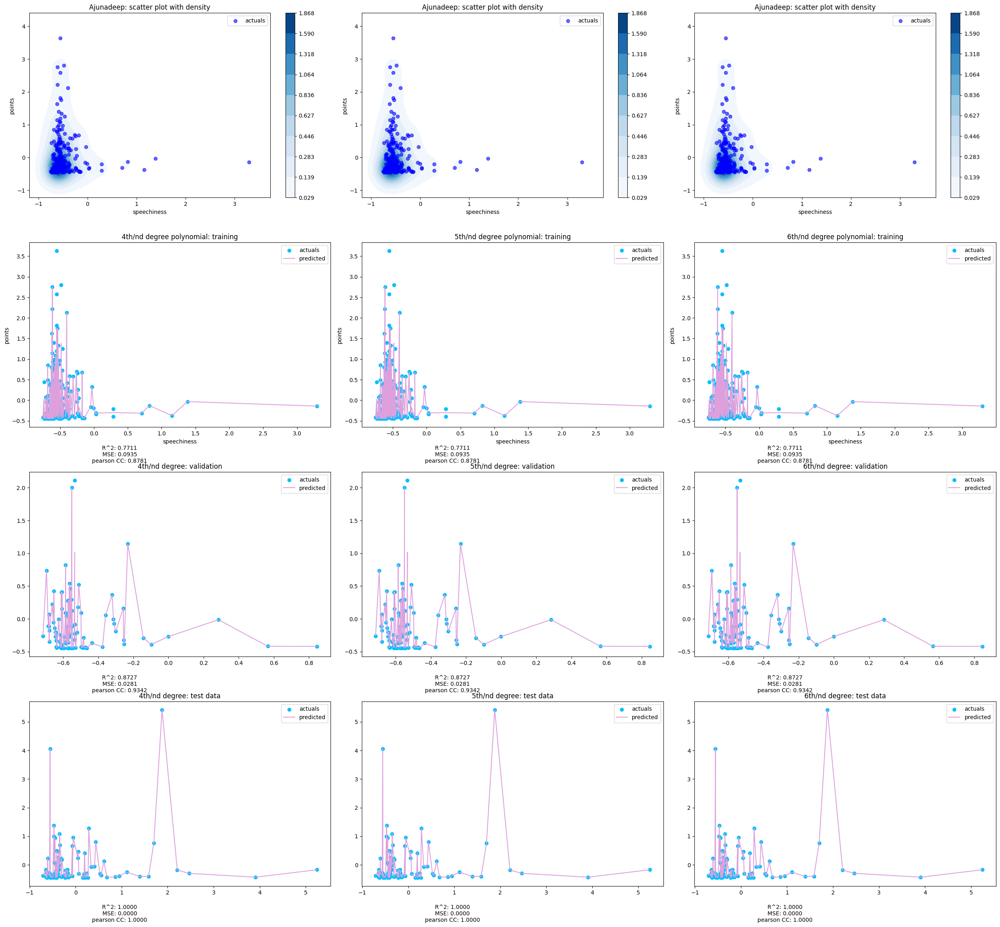

In [23]:
poly_regress_plots(anjunadeep_xtrain, anjunadeep_ytrain, anjunadeep_xvalidate, anjunadeep_yvalidate, anjunadeep_xtest, anjunadeep_ytest, anjunadeep, [4,5,6])

#### Drumcode
Techno (Peak Time/Driving), among other techno genres, label founded by Adam Bayer. Drumcode had been losing popularity, which made them try and catch the awful Aterlife uptempo trend by bringing famous Afterlife artists, like Massano, deeper into the fold. The result? More bad music and the continued fading of a techno giant. 

drumcode training MSEs: [0.7743811483349154, 0.350357879672033, 0.35035527879006706, 0.350355278790067, 0.35035527879006706]
drumcode validation MSEs: [7.051614635765352, 2.9002295074803497e+24, 1824678.6941432469, 221391.2543974012, 23835244.135469425]


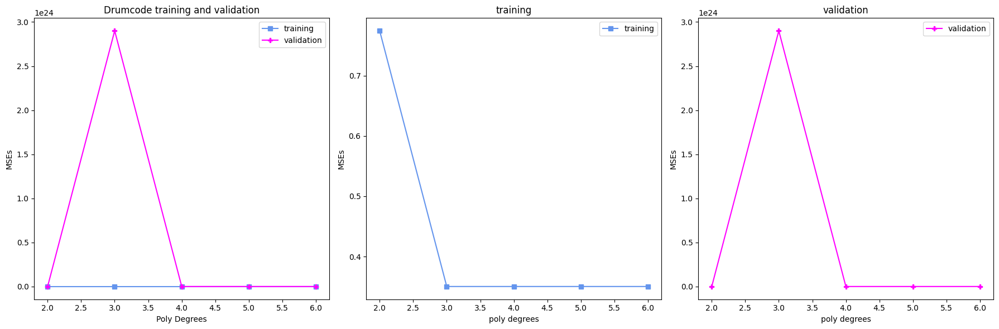

In [105]:
drumcode_degrees = [2, 3, 4, 5, 6]
drumcode_label_mask = (standard_scaling_train[:, 2] == 2027.)
drumcode_label_validate_mask = (standard_scaling_validate[:, 2] == 2027.)

drumcode_xtrain = standard_scaling_train[drumcode_label_mask, 4:12]
drumcode_ytrain = standard_scaling_train[drumcode_label_mask, 12]

drumcode_xvalidate = standard_scaling_validate[drumcode_label_validate_mask, 4:12]
drumcode_yvalidate = standard_scaling_validate[drumcode_label_validate_mask, 12]

drumcode_xtest = standard_scaling_test[drumcode_label_validate_mask, 4:12]
drumcode_ytest = standard_scaling_test[drumcode_label_validate_mask, 12]

drumcode_train_mses, drumcode_validate_mses = poly_degree_regress(drumcode_xtrain, drumcode_ytrain, drumcode_xvalidate, drumcode_yvalidate, drumcode_degrees)

# Print results
print("drumcode training MSEs:", drumcode_train_mses)
print("drumcode validation MSEs:", drumcode_validate_mses)

plot_mse_charts(drumcode_degrees, drumcode_train_mses, drumcode_validate_mses, drumcode)

Drumcode training shape: (214, 8)
Drumcode validate shape: (60, 8)
Drumcode test shape: (60, 8)


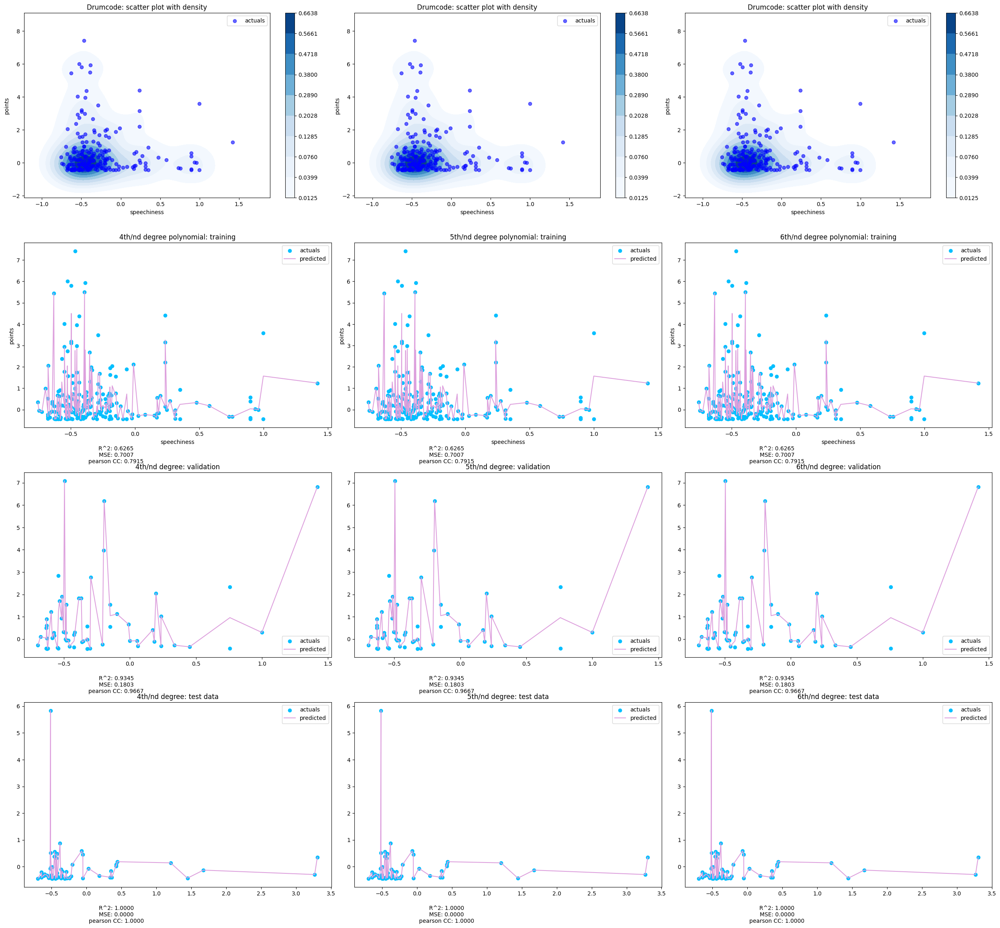

In [107]:
poly_regress_plots(drumcode_xtrain, drumcode_ytrain, drumcode_xvalidate, drumcode_yvalidate, drumcode_xtest, drumcode_ytest, drumcode, [4,5,6])

#### All Day I Dream
Organc House/Downtempo label founded by Lee Burridge. Runs the best summer day time party in New York City (and elsewhere!). Unless your soul is dark, you'll find this music pretty hard to dislike. ALl we need to do is get them to stop using the Brooklyn Mirage, which is what happens when people with bad music tastes design a sound system for the outdoors.

dreamer training MSEs: [0.47799425512211474, 0.24084930357862702, 0.21624638584075537, 0.2162463858407554, 0.2162463858407554]
dreamer validation MSEs: [0.4737715256349227, 65209.161812806495, 64860.07154360382, 41302.52584827095, 6325600.949270057]


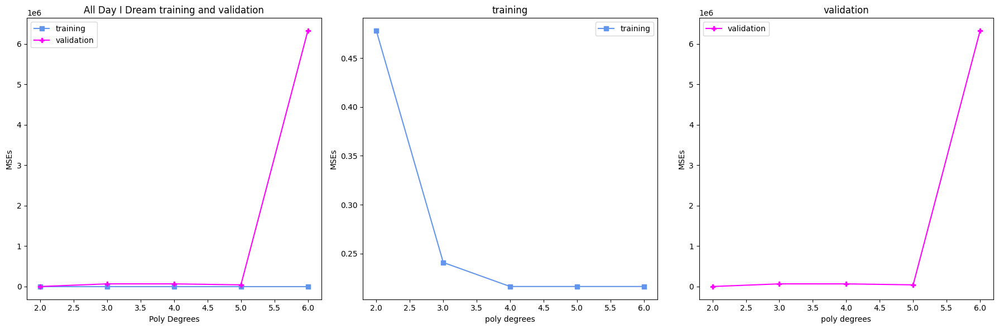

In [108]:
dreamer_degrees = [2, 3, 4, 5, 6]
dreamer_label_mask = (standard_scaling_train[:, 2] == 23038.)
dreamer_label_validate_mask = (standard_scaling_validate[:, 2] == 23038.)

dreamer_xtrain = standard_scaling_train[dreamer_label_mask, 4:12]
dreamer_ytrain = standard_scaling_train[dreamer_label_mask, 12]

dreamer_xvalidate = standard_scaling_validate[dreamer_label_validate_mask, 4:12]
dreamer_yvalidate = standard_scaling_validate[dreamer_label_validate_mask, 12]

dreamer_xtest = standard_scaling_test[dreamer_label_validate_mask, 4:12]
dreamer_ytest = standard_scaling_test[dreamer_label_validate_mask, 12]

dreamer_train_mses, dreamer_validate_mses = poly_degree_regress(dreamer_xtrain, dreamer_ytrain, dreamer_xvalidate, dreamer_yvalidate, dreamer_degrees)

print("dreamer training MSEs:", dreamer_train_mses)
print("dreamer validation MSEs:", dreamer_validate_mses)
plot_mse_charts(dreamer_degrees, dreamer_train_mses, dreamer_validate_mses, dreamer)

All Day I Dream training shape: (201, 8)
All Day I Dream validate shape: (59, 8)
All Day I Dream test shape: (59, 8)


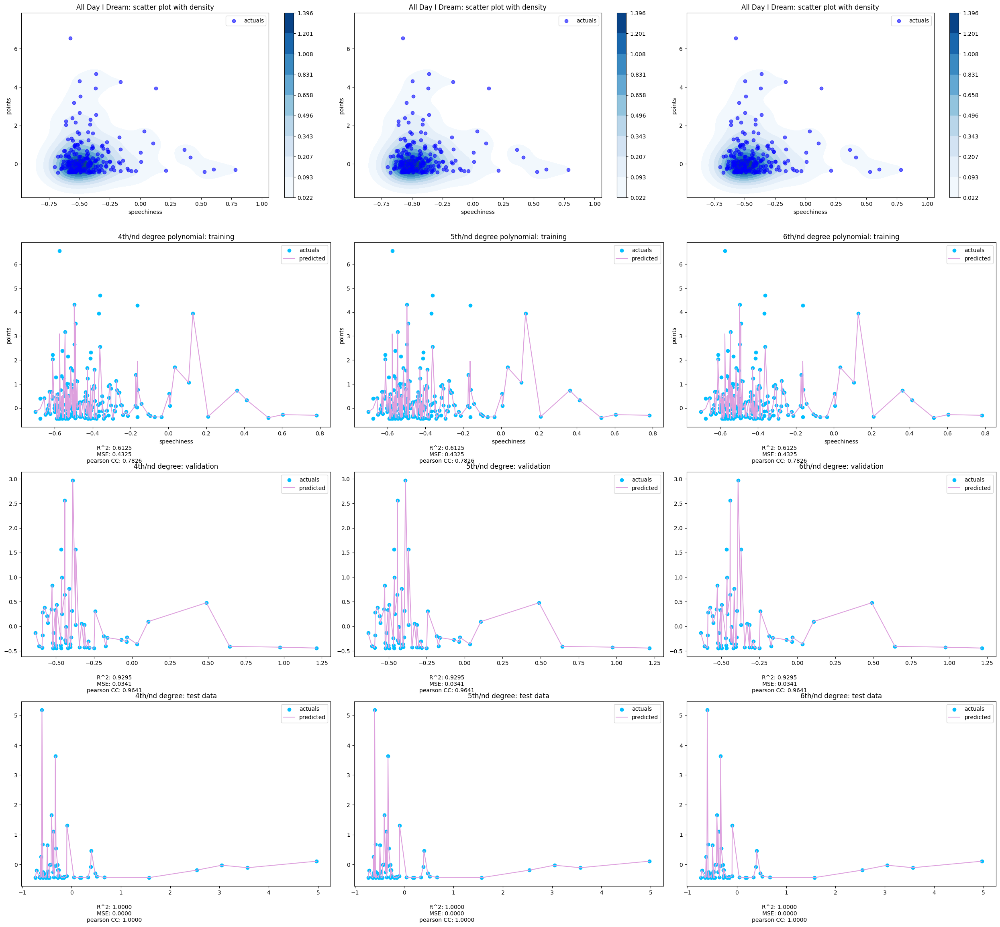

In [109]:
poly_regress_plots(dreamer_xtrain, dreamer_ytrain, dreamer_xvalidate, dreamer_yvalidate, dreamer_xtest, dreamer_ytest, dreamer, [4,5,6])

### Power Scaling by Genre

#### Techno (Peak Time/Driving)

Techno training MSEs: [0.48704061434427165, 0.4690430929326683, 0.41886683078544773, 0.2852204377516836, 0.06518653626954071]
Techno validation MSEs: [0.4936252066675698, 0.5099756668327715, 0.6870155677581941, 107.76991408751788, 94624.57713846945]


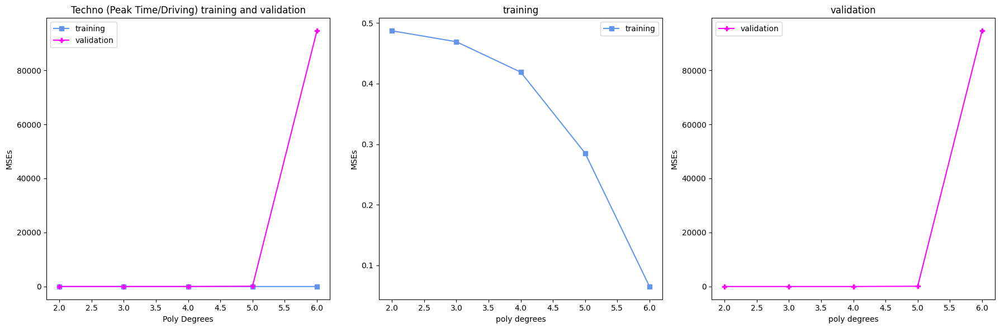

In [88]:
power_techno_genre_mask = (power_scaling_train[:, 3] == 6.)
power_techno_genre_validate_mask = (power_scaling_validate[:, 3] == 6.)
power_techno_genre_test_mask = (power_scaling_test[:, 3] == 6.)

power_techno_xtrain = power_scaling_train[power_techno_genre_mask, 4:12]
power_techno_ytrain = power_scaling_train[power_techno_genre_mask, 12]

power_techno_xvalidate = power_scaling_validate[power_techno_genre_validate_mask, 4:12]
power_techno_yvalidate = power_scaling_validate[power_techno_genre_validate_mask, 12]

power_techno_xtest = power_scaling_test[power_techno_genre_test_mask, 4:12]
power_techno_ytest = power_scaling_test[power_techno_genre_test_mask, 12]

power_techno_train_mses, power_techno_validate_mses = poly_degree_regress(power_techno_xtrain, power_techno_ytrain, power_techno_xvalidate, power_techno_yvalidate, techno_degrees)

print("Techno training MSEs:", power_techno_train_mses)
print("Techno validation MSEs:", power_techno_validate_mses)
plot_mse_charts(techno_degrees, power_techno_train_mses, power_techno_validate_mses, techno)

Techno (Peak Time/Driving) training shape: (2988, 8)
Techno (Peak Time/Driving) validate shape: (945, 8)
Techno (Peak Time/Driving) test shape: (924, 8)


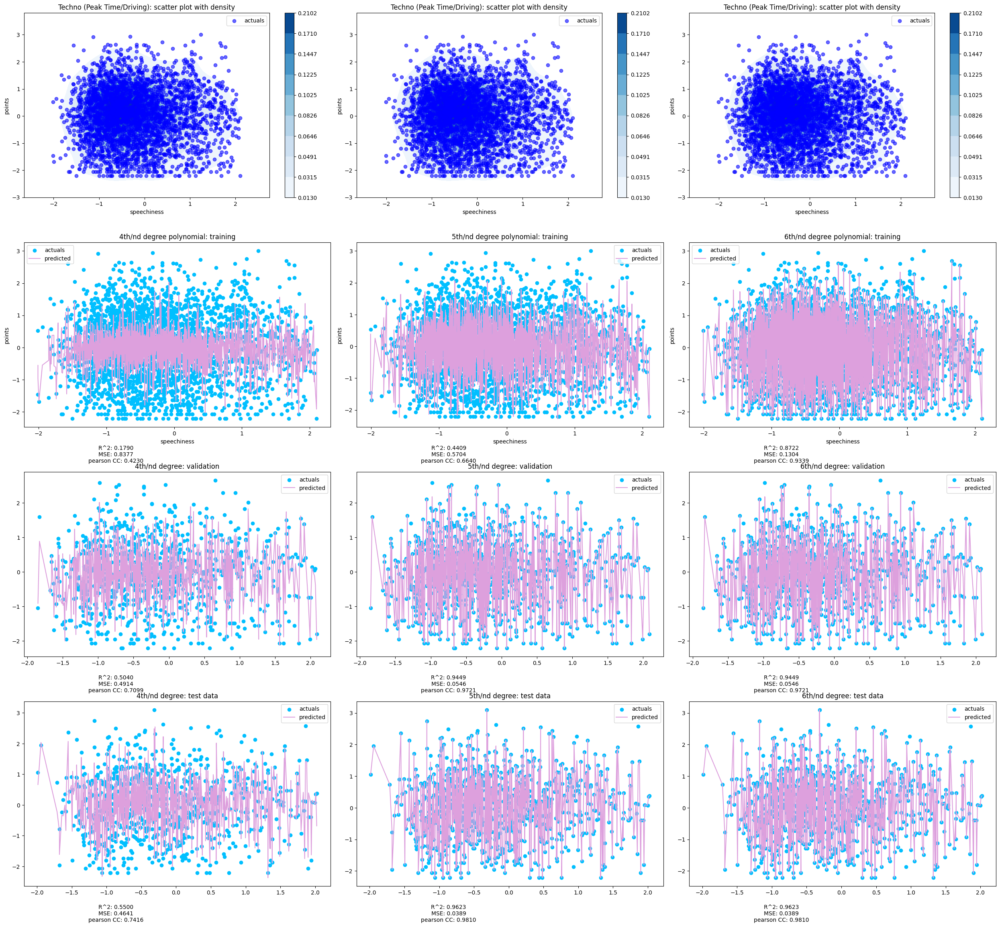

In [89]:
poly_regress_plots(power_techno_xtrain, power_techno_ytrain, power_techno_xvalidate, power_techno_yvalidate, 
                                  power_techno_xtest, power_techno_ytest, techno, [4,5,6])


#### Melodic House and Techno

melodic training MSEs: [0.45781475653249437, 0.43425516475631704, 0.3782523477309413, 0.23493131879651852, 0.07489692618924962]
melodic validation MSEs: [0.4922369406657447, 0.5357272180187187, 0.7213035922918225, 14.039086370222904, 4.817245067611301e+17]


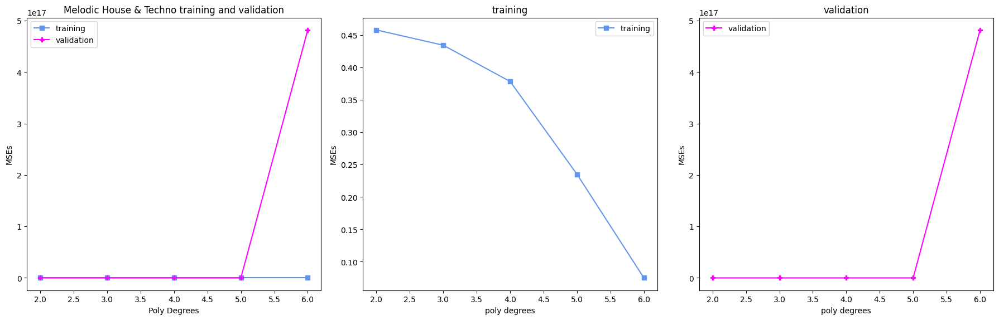

In [90]:
power_melodic_genre_mask = (power_scaling_train[:, 3] == 90.)
power_melodic_genre_validate_mask = (power_scaling_validate[:, 3] == 90.)
power_melodic_genre_test_mask = (power_scaling_test[:, 3] == 90.)

power_melodic_xtrain = power_scaling_train[power_melodic_genre_mask, 4:12]
power_melodic_ytrain = power_scaling_train[power_melodic_genre_mask, 12]

power_melodic_xvalidate = power_scaling_validate[power_melodic_genre_validate_mask, 4:12]
power_melodic_yvalidate = power_scaling_validate[power_melodic_genre_validate_mask, 12]

power_melodic_xtest = power_scaling_test[power_melodic_genre_test_mask, 4:12]
power_melodic_ytest = power_scaling_test[power_melodic_genre_test_mask, 12]

power_melodic_train_mses, power_melodic_validate_mses = poly_degree_regress(power_melodic_xtrain, power_melodic_ytrain, power_melodic_xvalidate, power_melodic_yvalidate, melodic_degrees)

print("melodic training MSEs:", power_melodic_train_mses)
print("melodic validation MSEs:", power_melodic_validate_mses)
plot_mse_charts(melodic_degrees, power_melodic_train_mses, power_melodic_validate_mses, melodic)

Melodic House & Techno training shape: (2453, 8)
Melodic House & Techno validate shape: (836, 8)
Melodic House & Techno test shape: (786, 8)


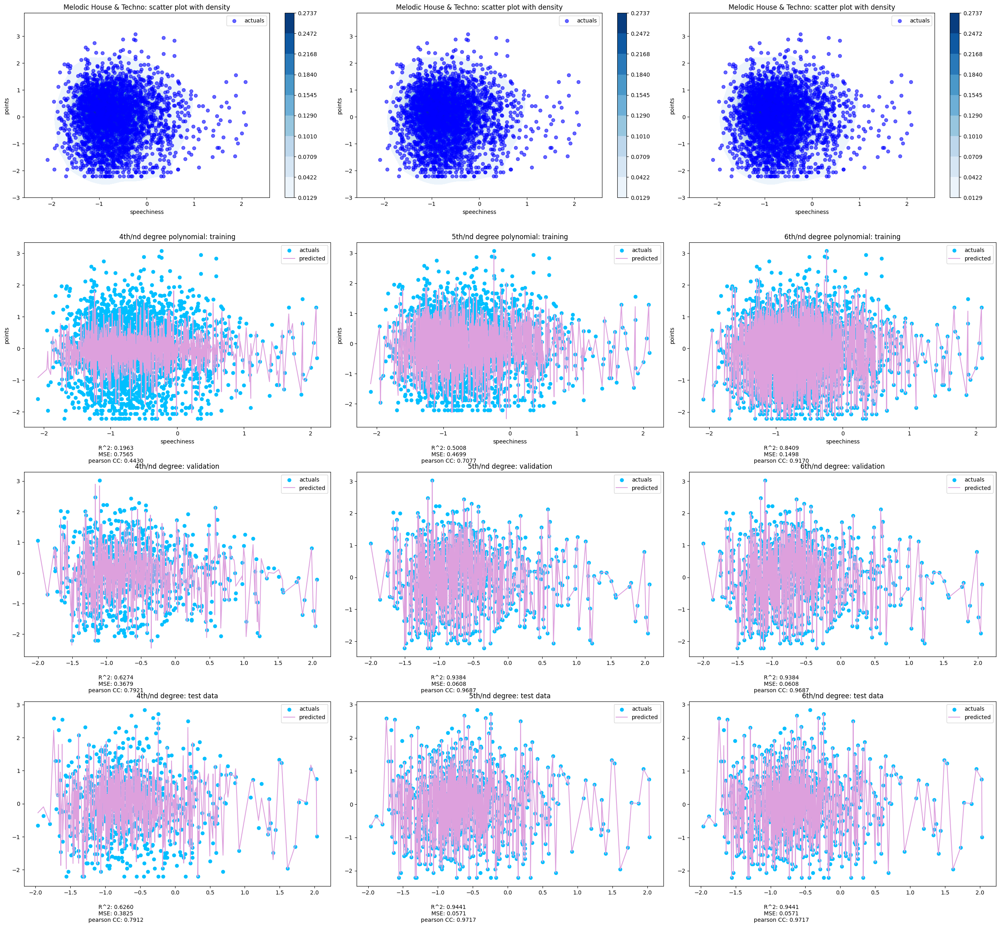

In [92]:
poly_regress_plots(power_melodic_xtrain, power_melodic_ytrain, power_melodic_xvalidate, power_melodic_yvalidate, 
                                  power_melodic_xtest, power_melodic_ytest, melodic, [4,5,6])


#### Organic House/Down Tempo

organic training MSEs: [0.45455863317816597, 0.4324288883110739, 0.3657645427967477, 0.21309457931865947, 0.06428738196094527]
organic validation MSEs: [0.5023399255341102, 0.5389394991796278, 1.1229609834277436, 61.50064942106755, 2.800511222439947e+21]


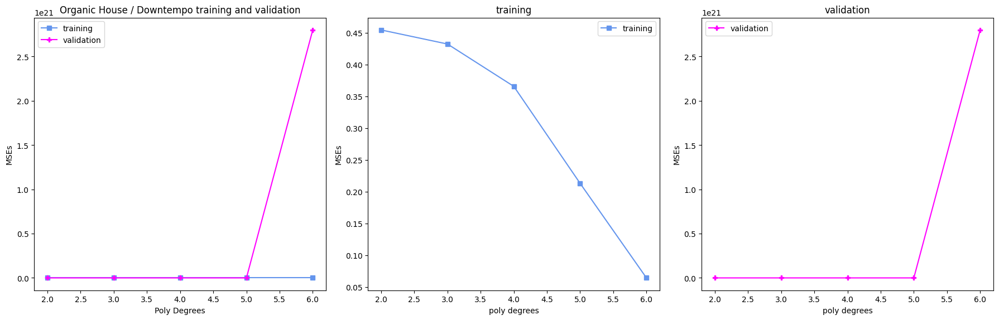

In [96]:
power_organic_genre_mask = (power_scaling_train[:, 3] == 93.)
power_organic_genre_validate_mask = (power_scaling_validate[:, 3] == 93.)
power_organic_genre_test_mask = (power_scaling_test[:, 3] == 93.)

power_organic_xtrain = power_scaling_train[power_organic_genre_mask, 4:12]
power_organic_ytrain = power_scaling_train[power_organic_genre_mask, 12]

power_organic_xvalidate = power_scaling_validate[power_organic_genre_validate_mask, 4:12]
power_organic_yvalidate = power_scaling_validate[power_organic_genre_validate_mask, 12]

power_organic_xtest = power_scaling_test[power_organic_genre_test_mask, 4:12]
power_organic_ytest = power_scaling_test[power_organic_genre_test_mask, 12]

power_organic_train_mses, power_organic_validate_mses = poly_degree_regress(power_organic_xtrain, power_organic_ytrain, power_organic_xvalidate, power_organic_yvalidate, organic_degrees)

print("organic training MSEs:", power_organic_train_mses)
print("organic validation MSEs:", power_organic_validate_mses)
plot_mse_charts(organic_degrees, power_organic_train_mses, power_organic_validate_mses, organic)

Organic House / Downtempo training shape: (2302, 8)
Organic House / Downtempo validate shape: (787, 8)
Organic House / Downtempo test shape: (728, 8)


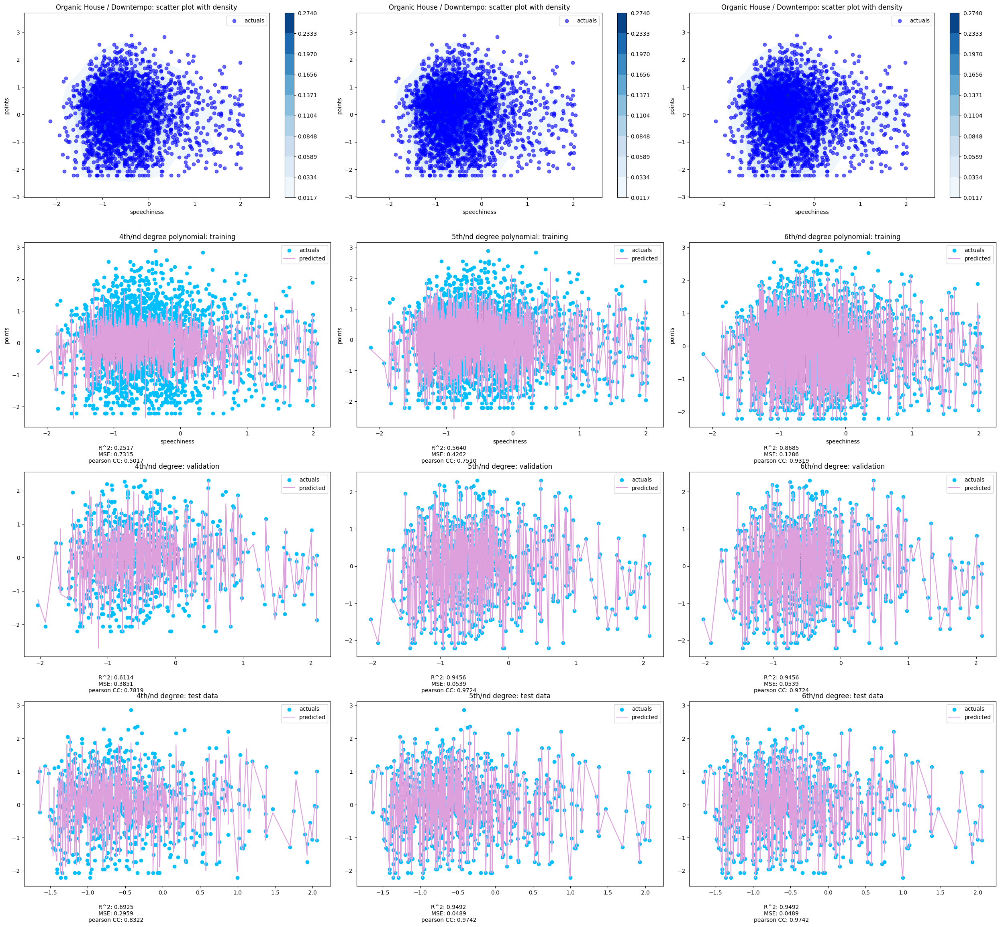

In [95]:
poly_regress_plots(power_organic_xtrain, power_organic_ytrain, power_organic_xvalidate, power_organic_yvalidate, 
                                  power_organic_xtest, power_organic_ytest, organic, [4,5,6])


### Power Scaling by label

#### Afterlife

afterlife training MSEs: [0.34464295332679706, 0.17609630757318787, 0.17562458930486258, 0.1756246007529237, 0.17562458942472173]
afterlife validation MSEs: [0.7773050072817514, 4.881864277901095e+24, 10.519296524770166, 1.7360270173639918e+19, 6.2410416925673464e+16]


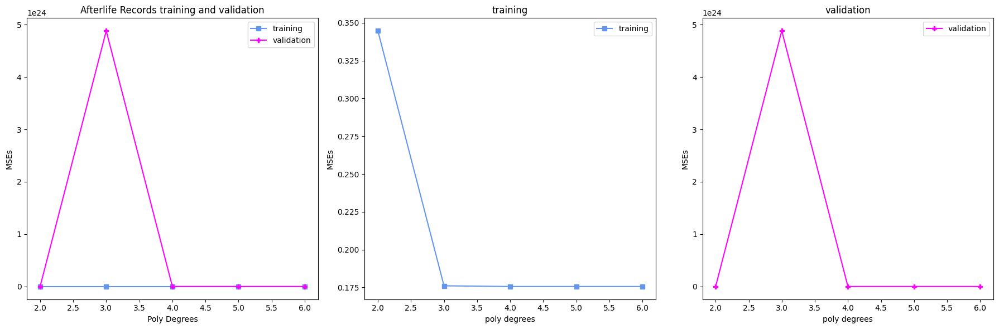

In [110]:
power_afterlife_label_mask = (power_scaling_train[:, 2] == 56958.)
power_afterlife_label_validate_mask = (power_scaling_validate[:, 2] == 56958.)
power_afterlife_label_test_mask = (power_scaling_test[:, 2] == 56958.)

power_afterlife_xtrain = power_scaling_train[power_afterlife_label_mask, 4:12]
power_afterlife_ytrain = power_scaling_train[power_afterlife_label_mask, 12]

power_afterlife_xvalidate = power_scaling_validate[power_afterlife_label_validate_mask, 4:12]
power_afterlife_yvalidate = power_scaling_validate[power_afterlife_label_validate_mask, 12]

power_afterlife_xtest = power_scaling_test[power_afterlife_label_test_mask, 4:12]
power_afterlife_ytest = power_scaling_test[power_afterlife_label_test_mask, 12]

power_afterlife_train_mses, power_afterlife_validate_mses = poly_degree_regress(power_afterlife_xtrain, power_afterlife_ytrain, power_afterlife_xvalidate, power_afterlife_yvalidate, afterlife_degrees)

print("afterlife training MSEs:", power_afterlife_train_mses)
print("afterlife validation MSEs:", power_afterlife_validate_mses)
plot_mse_charts(afterlife_degrees, power_afterlife_train_mses, power_afterlife_validate_mses, afterlife)

Afterlife Records training shape: (169, 8)
Afterlife Records validate shape: (53, 8)
Afterlife Records test shape: (60, 8)


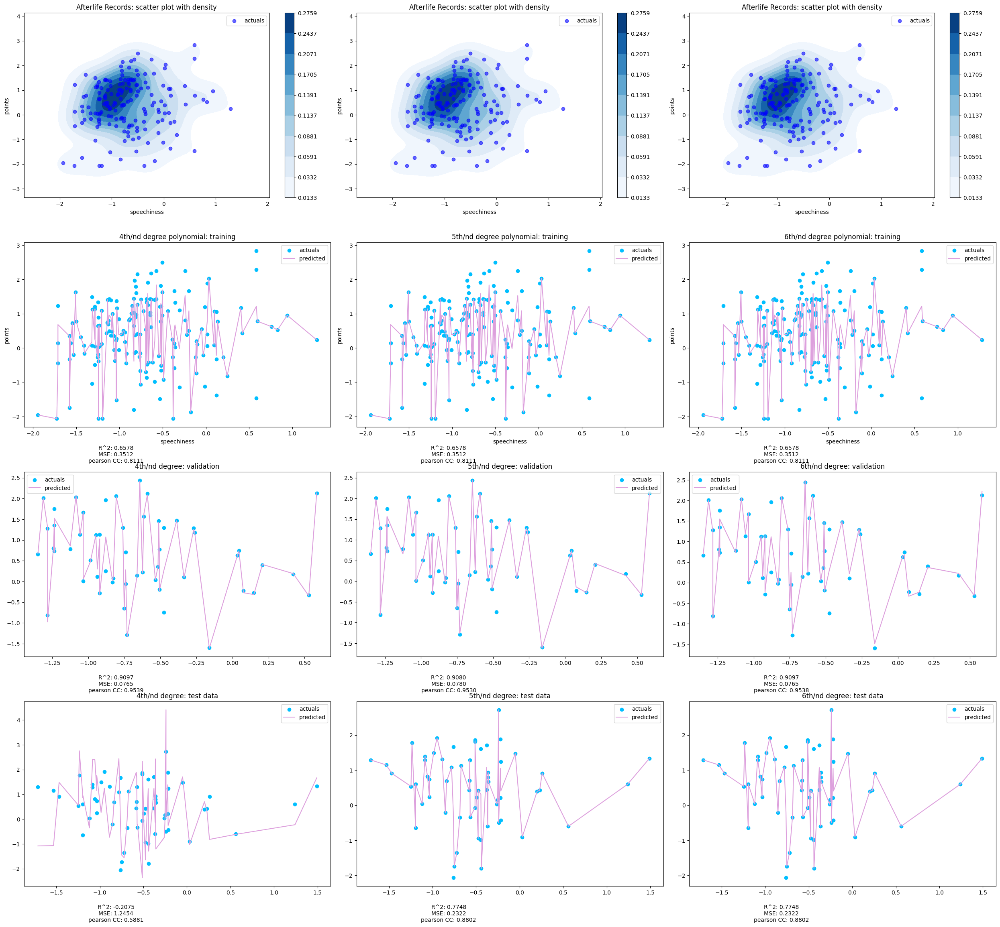

In [111]:
poly_regress_plots(power_afterlife_xtrain, power_afterlife_ytrain, power_afterlife_xvalidate, power_afterlife_yvalidate, 
                                  power_afterlife_xtest, power_afterlife_ytest, afterlife, [4,5,6])

#### Anjunadeep

anjunadeep training MSEs: [0.3557243470634828, 0.18678859244719076, 0.09599158551140569, 0.09599157570003526, 0.09599160953553765]
anjunadeep validation MSEs: [0.5138575813722264, 6.6597887296390885, 2.554459522780113e+19, 2.613725691701805e+19, 1.7689713429453767e+20]


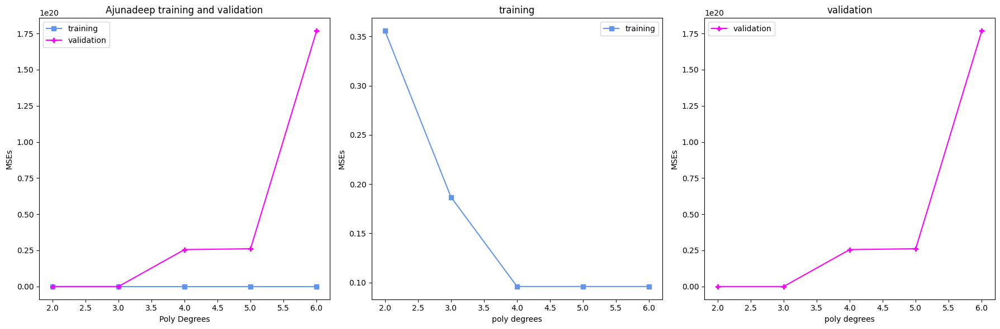

In [112]:
power_anjunadeep_label_mask = (power_scaling_train[:, 2] == 1390.)
power_anjunadeep_label_validate_mask = (power_scaling_validate[:, 2] == 1390.)
power_anjunadeep_label_test_mask = (power_scaling_test[:, 2] == 1390.)

power_anjunadeep_xtrain = power_scaling_train[power_anjunadeep_label_mask, 4:12]
power_anjunadeep_ytrain = power_scaling_train[power_anjunadeep_label_mask, 12]

power_anjunadeep_xvalidate = power_scaling_validate[power_anjunadeep_label_validate_mask, 4:12]
power_anjunadeep_yvalidate = power_scaling_validate[power_anjunadeep_label_validate_mask, 12]

power_anjunadeep_xtest = power_scaling_test[power_anjunadeep_label_test_mask, 4:12]
power_anjunadeep_ytest = power_scaling_test[power_anjunadeep_label_test_mask, 12]

power_anjunadeep_train_mses, power_anjunadeep_validate_mses = poly_degree_regress(power_anjunadeep_xtrain, power_anjunadeep_ytrain, power_anjunadeep_xvalidate, power_anjunadeep_yvalidate, anjunadeep_degrees)

print("anjunadeep training MSEs:", power_anjunadeep_train_mses)
print("anjunadeep validation MSEs:", power_anjunadeep_validate_mses)
plot_mse_charts(anjunadeep_degrees, power_anjunadeep_train_mses, power_anjunadeep_validate_mses, anjunadeep)

Ajunadeep training shape: (247, 8)
Ajunadeep validate shape: (81, 8)
Ajunadeep test shape: (102, 8)


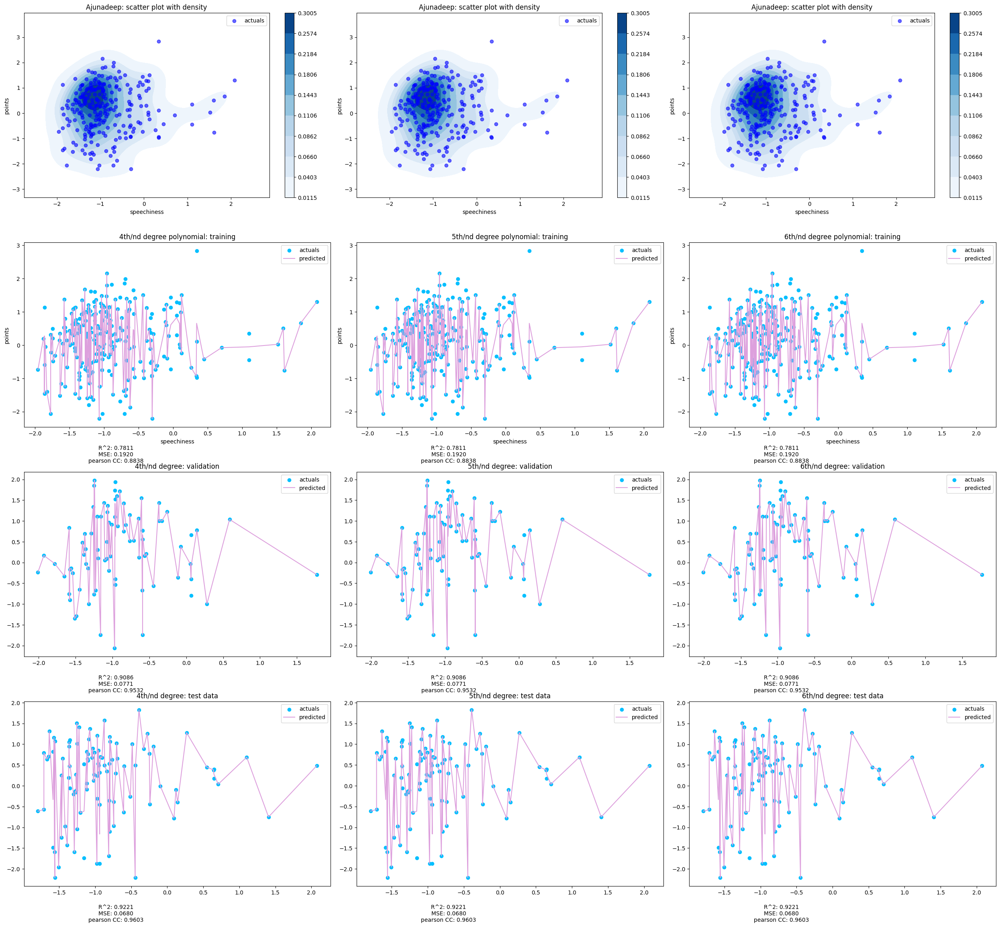

In [113]:
poly_regress_plots(power_anjunadeep_xtrain, power_anjunadeep_ytrain, power_anjunadeep_xvalidate, power_anjunadeep_yvalidate, 
                                  power_anjunadeep_xtest, power_anjunadeep_ytest, anjunadeep, [4,5,6])

#### Drumcode

drumcode training MSEs: [0.3446065868838398, 0.22110363151570742, 0.22114978661049264, 0.22109891436713314, 0.22109673504384936]
drumcode validation MSEs: [0.5842932562321308, 1.0536502371938417e+23, 2.1974593331223824e+22, 2.1664114924957073e+21, 3.1994588984658125e+19]


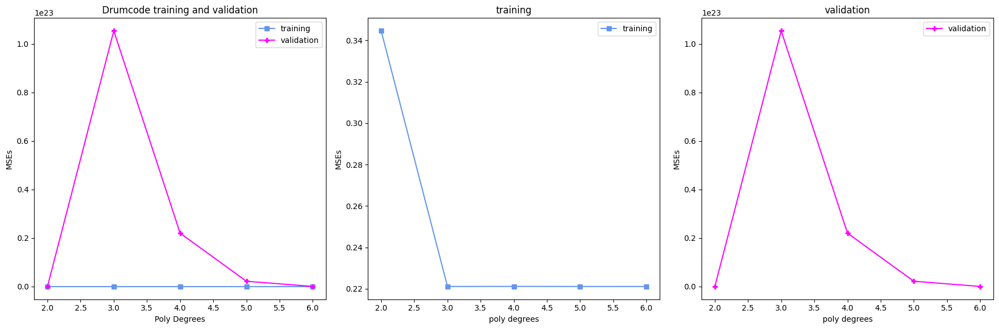

In [114]:
power_drumcode_label_mask = (power_scaling_train[:, 2] == 2027.)
power_drumcode_label_validate_mask = (power_scaling_validate[:, 2] == 2027.)
power_drumcode_label_test_mask = (power_scaling_test[:, 2] == 2027.)

power_drumcode_xtrain = power_scaling_train[power_drumcode_label_mask, 4:12]
power_drumcode_ytrain = power_scaling_train[power_drumcode_label_mask, 12]

power_drumcode_xvalidate = power_scaling_validate[power_drumcode_label_validate_mask, 4:12]
power_drumcode_yvalidate = power_scaling_validate[power_drumcode_label_validate_mask, 12]

power_drumcode_xtest = power_scaling_test[power_drumcode_label_test_mask, 4:12]
power_drumcode_ytest = power_scaling_test[power_drumcode_label_test_mask, 12]

power_drumcode_train_mses, power_drumcode_validate_mses = poly_degree_regress(power_drumcode_xtrain, power_drumcode_ytrain, power_drumcode_xvalidate, power_drumcode_yvalidate, drumcode_degrees)

print("drumcode training MSEs:", power_drumcode_train_mses)
print("drumcode validation MSEs:", power_drumcode_validate_mses)
plot_mse_charts(drumcode_degrees, power_drumcode_train_mses, power_drumcode_validate_mses, drumcode)

Drumcode training shape: (208, 8)
Drumcode validate shape: (63, 8)
Drumcode test shape: (67, 8)


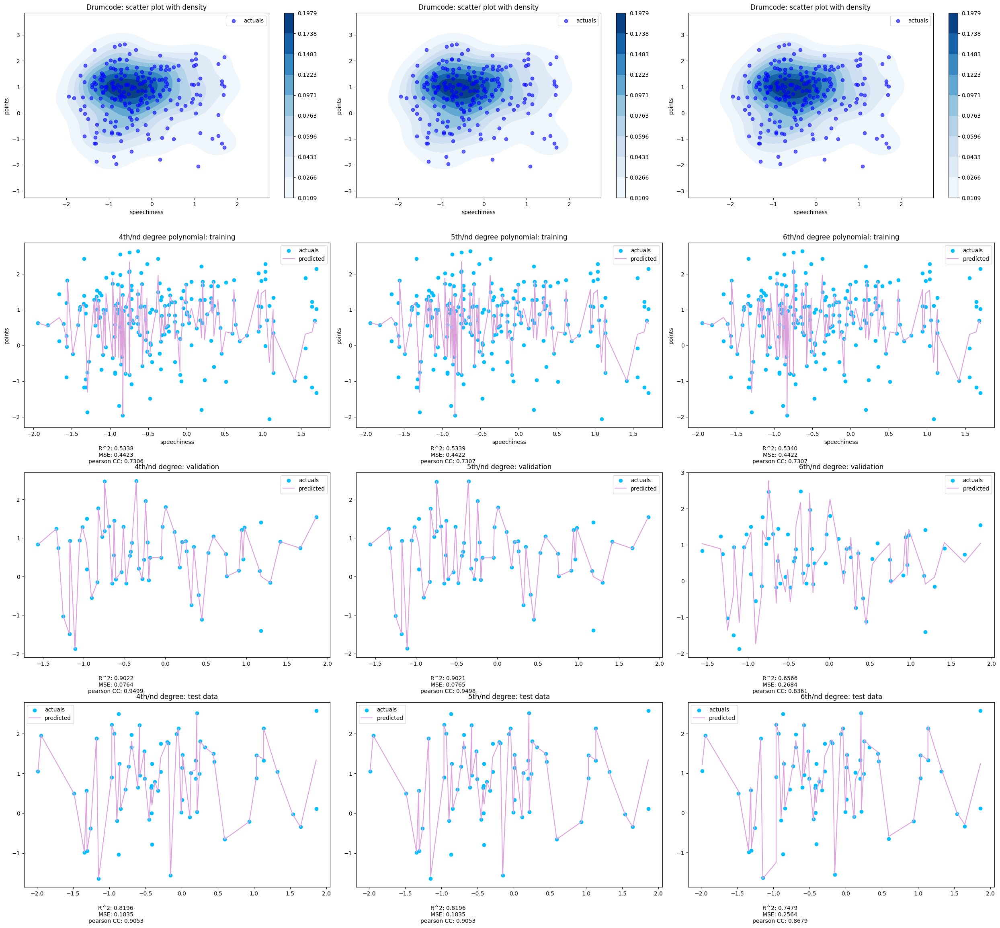

In [115]:
poly_regress_plots(power_drumcode_xtrain, power_drumcode_ytrain, power_drumcode_xvalidate, power_drumcode_yvalidate, 
                                  power_drumcode_xtest, power_drumcode_ytest, drumcode, [4,5,6])

#### All Day I Dream

dreamer training MSEs: [0.2783031725067901, 0.12211841668775043, 0.12211832384975237, 0.12211830671285966, 0.12211920239526862]
dreamer validation MSEs: [0.669398357316578, 2.1434265678536617e+21, 3.1664141668762006e+20, 2.962364416442523e+19, 1.1504832476393156e+23]


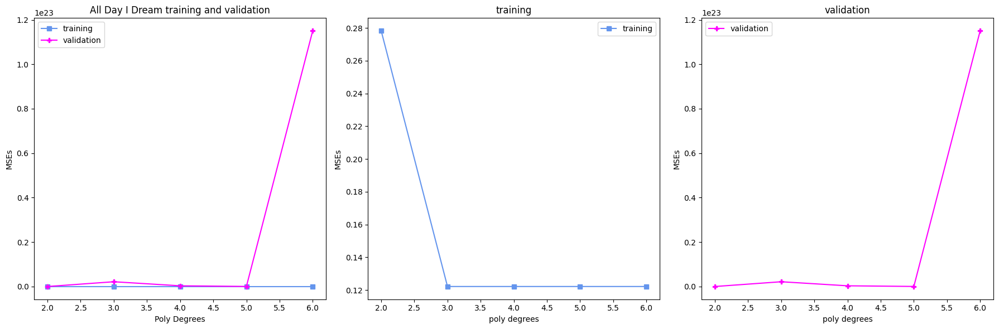

In [116]:
power_dreamer_label_mask = (power_scaling_train[:, 2] == 23038.)
power_dreamer_label_validate_mask = (power_scaling_validate[:, 2] == 23038.)
power_dreamer_label_test_mask = (power_scaling_test[:, 2] == 23038.)

power_dreamer_xtrain = power_scaling_train[power_dreamer_label_mask, 4:12]
power_dreamer_ytrain = power_scaling_train[power_dreamer_label_mask, 12]

power_dreamer_xvalidate = power_scaling_validate[power_dreamer_label_validate_mask, 4:12]
power_dreamer_yvalidate = power_scaling_validate[power_dreamer_label_validate_mask, 12]

power_dreamer_xtest = power_scaling_test[power_dreamer_label_test_mask, 4:12]
power_dreamer_ytest = power_scaling_test[power_dreamer_label_test_mask, 12]

power_dreamer_train_mses, power_dreamer_validate_mses = poly_degree_regress(power_dreamer_xtrain, power_dreamer_ytrain, power_dreamer_xvalidate, power_dreamer_yvalidate, dreamer_degrees)

print("dreamer training MSEs:", power_dreamer_train_mses)
print("dreamer validation MSEs:", power_dreamer_validate_mses)
plot_mse_charts(dreamer_degrees, power_dreamer_train_mses, power_dreamer_validate_mses, dreamer)

All Day I Dream training shape: (183, 8)
All Day I Dream validate shape: (81, 8)
All Day I Dream test shape: (63, 8)


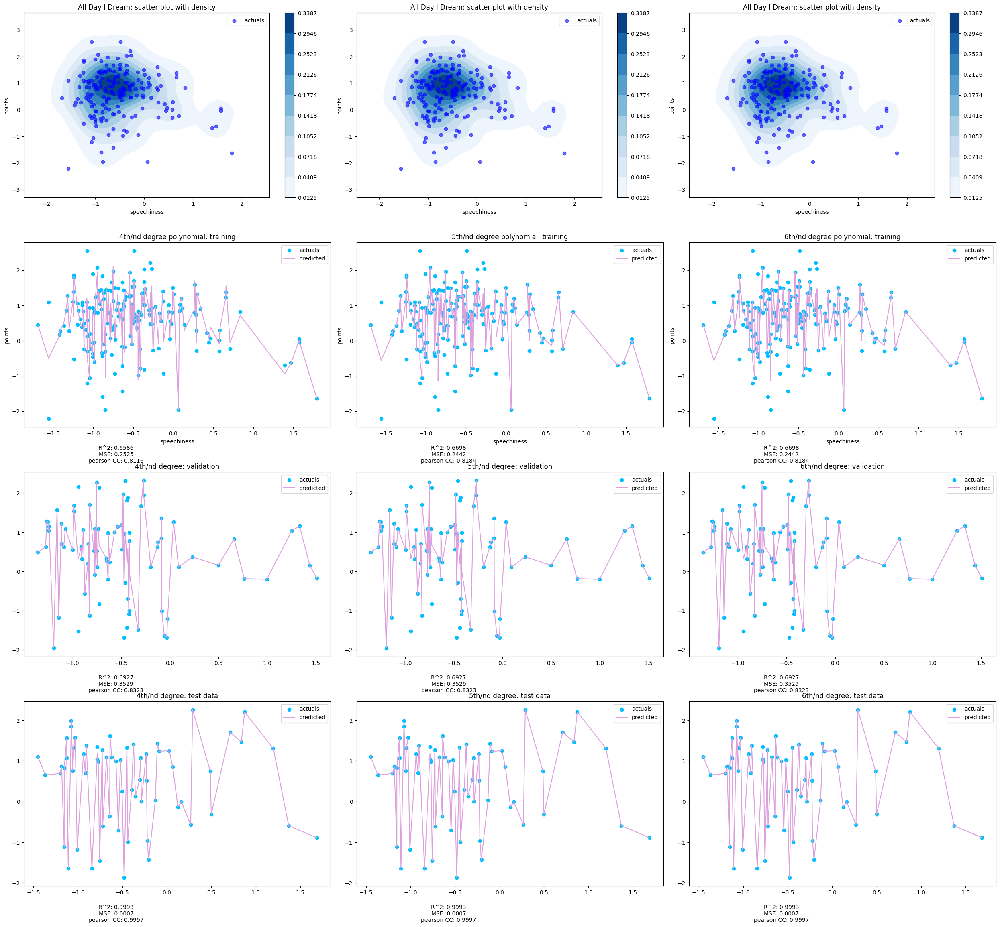

In [117]:
poly_regress_plots(power_dreamer_xtrain, power_dreamer_ytrain, power_dreamer_xvalidate, power_dreamer_yvalidate, 
                                  power_dreamer_xtest, power_dreamer_ytest, dreamer, [4,5,6])